# EDA on credit score classification

## Table of Contents

#### 1. Summary
#### 2 .Data Dictionary
#### 3. Importing Libraries
#### 4. Exploratory Data Analysis
       - 4.1 Data Cleaning
       - 4.2 Descriptive Statistics
       - 4.3 Univariate Analysis
       - 4.4 Bivariate  Analysis
       - 4.5 Multivariate Analysis
#### 5. Missing value treatment
#### 6. Outlier detection
#### 7. Data Transformation
       - 7.1 Lable Encoding
       - 7.2 Scaling

# 1. Summary

The project is an exploratory data analysis (EDA) phase to gain insights into the dataset. Following the EDA, the data cleaning process involved handling missing values, removing duplicates, and addressing any inconsistencies or errors in the dataset. Additionally, data transformation techniques were employed to prepare the data for modeling, including feature scaling and encoding categorical variables.

# 2. Data Dictionary
##### ID: Represents a unique identification of an entry
##### Customer_ID: Represents a unique identification of a person
##### Month: Represents the month of the year
##### Name: Represents the name of a person
##### Age: Represents the age of the person
##### SSN: Represents the social security number of a person
##### Occupation: Represents the occupation of the person
##### Annual_Income: Represents the annual income of the person
##### Monthly_Inhand_Salary: Represents the monthly base salary of a person
##### Num_Bank_Accounts: Represents the number of bank accounts a person holds
##### Num_Credit_Card: Represents the number of other credit cards held by a person
##### Interest_Rate: Represents the interest rate on credit card
##### Num_of_Loan: Represents the number of loans taken from the bank
##### Type_of_Loan: Represents the types of loan taken by a person
##### Delay_from_due_date: Represents the average number of days delayed from the payment date
##### Num_of_Delayed_Payment: Represents the average number of payments delayed by a person
##### Changed_Credit_Limit: Represents the percentage change in credit card limit
##### Num_Credit_Inquiries: Represents the number of credit card inquiries
##### Credit_Mix: Represents the classification of the mix of credits
##### Outstanding_Debt: Represents the remaining debt to be paid
##### Credit_Utilization_Ratio: Represents the utilization ratio of credit card
##### Credit_History_Age: Represents the age of credit history of the person
##### Payment_of_Min_Amount: Represents whether only the minimum amount was paid by the person
##### Total_EMI_per_month: Represents the monthly EMI payments
##### Amount_invested_monthly: Represents the monthly amount invested by the customer
##### Payment_Behaviour: Represents the payment behavior of the customer
##### Monthly_Balance:Represents the monthly balance amount of the customer
##### Credit_Score:Represents the bracket of credit score (Poor, Standard, Good) ((Target))

# 3.Importing Libraries

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot  as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.preprocessing import LabelEncoder,StandardScaler,OrdinalEncoder
LabelEncoder = LabelEncoder()
OrdinalEncoder = OrdinalEncoder()
standard_scale = StandardScaler()  

# 4. Exploratory Data Analysis

In [3]:
df=pd.read_csv('train.csv')

In [4]:
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [5]:
df.shape

(100000, 28)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [7]:
df.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

# 4.1. Data Cleaning

In [8]:
df = df.loc[:,~df.columns.duplicated()]

In [9]:
df.duplicated().sum()

0

##### 👉 There is no duplication in dataset.

In [10]:
df.drop(["ID","Customer_ID","Month","Name","SSN",'Amount_invested_monthly'],axis=1,inplace=True)

##### 👉 Dropped features such as "ID","Customer_ID","Month","Name","SSN","Amount_invested_monthly"etc. because either they aren't valuable for predicting churn or having major missing values.

### 4.1.1 Numeric values cleaning

#### Age

In [11]:
df["Age"]=df["Age"].str.replace("_","")
df["Age"]=df["Age"].str.replace("-","")

#### Changed_Credit_Limit

In [12]:
df["Changed_Credit_Limit"]=df["Changed_Credit_Limit"].str.replace("_","") 
df["Changed_Credit_Limit"]=df["Changed_Credit_Limit"].str.replace("-","") 

#### Num_of_Loan

In [13]:
df["Num_of_Loan"]=df["Num_of_Loan"].astype(str)

In [14]:
df["Num_of_Loan"]=df["Num_of_Loan"].str.replace("-","") 
df["Num_of_Loan"]=df["Num_of_Loan"].str.replace("_","") 

#### Num_of_Delayed_Payment

In [15]:
df["Num_of_Delayed_Payment"]=df["Num_of_Delayed_Payment"].str.replace("_","") 
df["Num_of_Delayed_Payment"]=df["Num_of_Delayed_Payment"].str.replace("-","") 

#### Annual_Income

In [16]:
df["Annual_Income"]=df["Annual_Income"].str.replace("_","")

#### Delay_from_due_date

In [17]:
df["Delay_from_due_date"]=df["Delay_from_due_date"].astype(str)

In [18]:
df["Delay_from_due_date"]=df["Delay_from_due_date"].str.replace("-","") 

In [19]:
TO_NUMERIC=["Age","Annual_Income","Num_of_Loan","Delay_from_due_date","Num_of_Delayed_Payment","Changed_Credit_Limit","Outstanding_Debt","Monthly_Balance"]             

####  to_numeric

In [20]:
for i in TO_NUMERIC:
    df[i] = pd.to_numeric(df[i],errors='coerce')

##### 👉 changed data type for  "Age","Annual_Income","Num_of_Loan","Delay_from_due_date","Num_of_Delayed_Payment","Changed_Credit_Limit","Outstanding_Debt","Monthly_Balance".

### 4.1.2 Categorical values cleaning

In [21]:
#Drop the incorrect data
df = df[df['Occupation'].str.contains('_______') == False]
df = df[df['Payment_Behaviour'].str.contains('!@9#%8') == False]
df = df[df['Type_of_Loan'].str.contains('Not Specified') == False]
df = df[df['Credit_Mix'].str.contains('_') == False]
df = df[df['Credit_History_Age'].str.contains('_') == False]

# 4.2 Descriptive Statistics 

In [22]:
df_num = df.select_dtypes(exclude='object')
df_cat = df.select_dtypes(include='object')

In [23]:
df_num.std()

Age                         6.988200e+02
Annual_Income               1.380676e+06
Monthly_Inhand_Salary       3.248035e+03
Num_Bank_Accounts           1.163712e+02
Num_Credit_Card             1.264807e+02
Interest_Rate               4.900944e+02
Num_of_Loan                 6.100923e+01
Delay_from_due_date         1.449660e+01
Num_of_Delayed_Payment      2.290100e+02
Changed_Credit_Limit        6.439133e+00
Num_Credit_Inquiries        1.900092e+02
Outstanding_Debt            1.104305e+03
Credit_Utilization_Ratio    5.080562e+00
Total_EMI_per_month         8.085794e+03
Monthly_Balance             2.076143e+02
dtype: float64

##### 👉 Remove Variables with Low Standard Deviation

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,35715.0,121.309086,6.988200e+02,14.000000,25.000000,34.000000,43.000000,8.682000e+03
Annual_Income,35715.0,171327.201934,1.380676e+06,7005.930000,19436.305000,37743.720000,73675.650000,2.419806e+07
Monthly_Inhand_Salary,30381.0,4241.822131,3.248035e+03,303.645417,1628.569167,3097.025000,6090.583333,1.520463e+04
Num_Bank_Accounts,35715.0,16.570237,1.163712e+02,-1.000000,3.000000,5.000000,7.000000,1.798000e+03
Num_Credit_Card,35715.0,21.934201,1.264807e+02,0.000000,4.000000,5.000000,7.000000,1.499000e+03
Interest_Rate,35715.0,77.139633,4.900944e+02,1.000000,7.000000,13.000000,20.000000,5.797000e+03
Num_of_Loan,35715.0,10.723562,6.100923e+01,1.000000,2.000000,3.000000,5.000000,1.482000e+03
Delay_from_due_date,35715.0,20.417248,1.449660e+01,0.000000,9.000000,17.000000,27.000000,6.700000e+01
Num_of_Delayed_Payment,33213.0,31.007166,2.290100e+02,0.000000,9.000000,13.000000,18.000000,4.397000e+03
Changed_Credit_Limit,34957.0,10.276936,6.439133e+00,0.000000,5.360000,9.340000,14.390000,3.629000e+01


### ↘️ Observation:

##### 👉  1.Age: The dataset ranges from 14 to 8682, with a mean of approximately 121.3. The large standard deviation of 698.82 suggests a significant spread, possibly due to outliers or data entry errors.

##### 👉 2.Annual Income: The average annual income is about 171,327.20, ranging from 7,005.93 to 24,198,060. The wide variation may be due to diverse professions or income sources.

##### 👉 3.Monthly Inhand Salary: The average monthly in-hand salary is roughly 4,241.82, with a significant standard deviation of 3,248.04, indicating considerable income variability.

##### 👉 4.Number of Bank Accounts: The mean number of bank accounts is approximately 16.57, with a possible data entry error indicated by the minimum value of -1.

##### 👉 5.Number of Credit Cards: On average, individuals have around 21.93 credit cards, with a minimum value of 0. A high number of credit cards might indicate a higher credit risk.

##### 👉 6.Interest Rate: The average interest rate is 77.14, with a considerable standard deviation of 490.09, suggesting wide variation across the dataset.

##### 👉 7.Number of Loans: On average, individuals have approximately 10.72 loans, with a maximum of 1,482.

##### 👉 8.Delay from Due Date: The average delay from the due date is 20.42, with a maximum of 67, indicating that many individuals have experienced delays in payment.

##### 👉 9.Number of Delayed Payments: The dataset shows an average of 31.01 delayed payments, with a maximum value of 4,397, suggesting frequent instances of delayed payments.

##### 👉 10.Changed Credit Limit: On average, the credit limit changes by 10.28, with a maximum change of 36.29, indicating significant alterations in credit limits for individuals.

##### 👉 11.Outstanding Debt: The average outstanding debt is 1,351.17, with a maximum of 4,998.07, suggesting that some individuals have substantial amounts of outstanding debt.

##### 👉 12.Credit Utilization Ratio: The average credit utilization ratio is 32.27%, implying that individuals utilize approximately one-third of their available credit on average.

##### 👉 13.Total EMI per Month: The average total EMI per month is 1,346.91, with a wide range extending up to 82,122, indicating varying levels of monthly EMI payments.

##### 👉 14.Monthly Balance: The average monthly balance is 402.38, with a maximum value of 1,552.95, suggesting varying levels of monthly balances among individuals.

In [25]:
df.describe(include=object).T

,count,unique,top,freq
Occupation,35715,15,Lawyer,2630
Type_of_Loan,35715,3365,Student Loan,814
Credit_Mix,35715,3,Standard,17106
Credit_History_Age,35715,403,15 Years and 11 Months,192
Payment_of_Min_Amount,35715,3,Yes,18096
Payment_Behaviour,35715,6,Low_spent_Small_value_payments,9850
Credit_Score,35715,3,Standard,19344


### ↘️ Observation:

##### 👉 1. Occupation: There are 15 unique occupations in the dataset, with the most frequent one being 'Lawyer,' occurring 2630  times.
##### 👉 2. Type of Loan: There are 3365 unique types of loans, with 'Student Loan' being the most frequent type, occurring 814 times.
##### 👉 3. Credit Mix: There are three categories in the dataset, with 'Standard' being the most frequent category, occurring 17106 times.
##### 👉 4. Credit History Age: There are 403 unique credit history ages, with '15 Years and 11 Months' being the most frequent, occurring 192 times.
##### 👉 5.Payment of Minimum Amount: There are three categories, and 'Yes' is the most frequent category, occurring 18096 times.
##### 👉 6.Payment Behavior: There are six types of payment behavior, with 'Low_spent_Small_value_payments' being the most frequent, occurring 9850 times.
##### 👉 7.Credit Score: There are three credit score categories, and 'Standard' is the most frequent, occurring 19344 times.

In [26]:
df_num

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Monthly_Balance
2,500,19114.12,NaN,3,4,3,4,3,7.0,NaN,4.0,809.98,28.609352,49.574949,331.209863
3,23,19114.12,NaN,3,4,3,4,5,4.0,6.27,4.0,809.98,31.377862,49.574949,223.451310
4,23,19114.12,1824.843333,3,4,3,4,6,NaN,11.27,4.0,809.98,24.797347,49.574949,341.489231
6,23,19114.12,1824.843333,3,4,3,4,3,8.0,11.27,4.0,809.98,22.537593,49.574949,244.565317
9,28,34847.84,3037.986667,2,4,6,1,7,1.0,7.42,2.0,605.03,38.550848,18.816215,484.591214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99986,28,20002.88,1929.906667,10,8,29,5,33,25.0,18.31,9.0,3571.70,24.713861,60.964772,345.743101
99991,29,20002.88,1929.906667,10,8,29,5,33,25.0,18.31,9.0,3571.70,37.140784,60.964772,337.362988
99993,25,39628.99,3359.415833,4,6,7,2,23,NaN,11.50,3.0,502.38,29.135447,58638.000000,400.104466
99997,25,39628.99,3359.415833,4,6,5729,2,27,6.0,11.50,3.0,502.38,41.255522,35.104023,516.809083


In [27]:
df_cat

,Occupation,Type_of_Loan,Credit_Mix,Credit_History_Age,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
2,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 3 Months,No,Low_spent_Medium_value_payments,Good
3,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 4 Months,No,Low_spent_Small_value_payments,Good
4,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 5 Months,No,High_spent_Medium_value_payments,Good
6,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 7 Months,No,Low_spent_Small_value_payments,Good
9,Teacher,Credit-Builder Loan,Good,26 Years and 8 Months,No,High_spent_Large_value_payments,Good
...,...,...,...,...,...,...,...
99986,Architect,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",Bad,5 Years and 10 Months,Yes,Low_spent_Small_value_payments,Poor
99991,Architect,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",Bad,6 Years and 3 Months,Yes,High_spent_Large_value_payments,Standard
99993,Mechanic,"Auto Loan, and Student Loan",Good,31 Years and 4 Months,No,Low_spent_Medium_value_payments,Standard
99997,Mechanic,"Auto Loan, and Student Loan",Good,31 Years and 8 Months,No,High_spent_Large_value_payments,Poor


### ↘️ Observation:
##### 👉 There are 7 categorical variables and 15 numerical variables.

# 4.3 Univariate Analysis

### Target variable

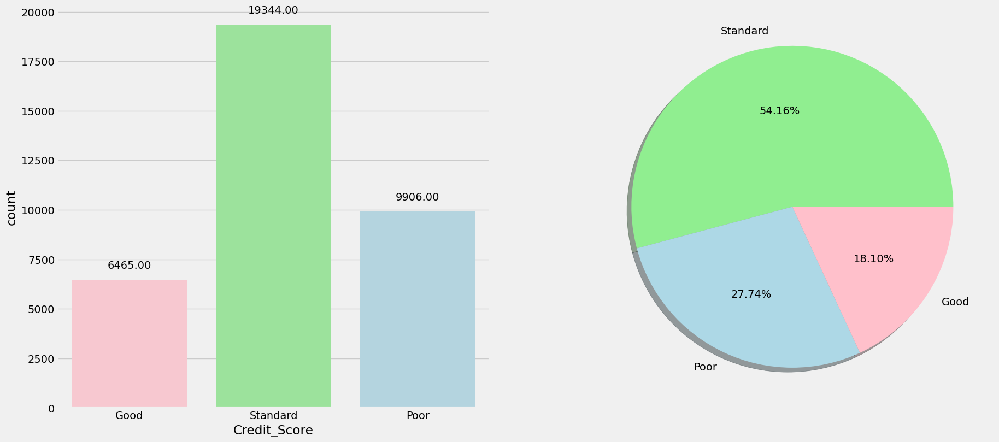

In [28]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
ax = sns.countplot(x='Credit_Score',data=df,palette=['pink','lightgreen','lightblue'])
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2. , p.get_height()), ha = 'center',
           xytext = (0, 15), textcoords = 'offset points')
plt.subplot(2,2,2)
Values  = df["Credit_Score"].value_counts().values
Lables  = df["Credit_Score"].value_counts().index
plt.pie(Values,labels=Lables,autopct='%.2f%%',shadow=True,colors=['lightgreen','lightblue','pink'])
plt.show()

### ↘️ Observation:

##### 👉 The Standard category has the highest credit score of 19344, followed by Poor with 9906, and Good with 6465. The pie chart shows that Standard accounts for 64.3% of the total credit score, Poor accounts for 26.2%, and Good accounts for 9.5%.

###  Numeric variable plot's

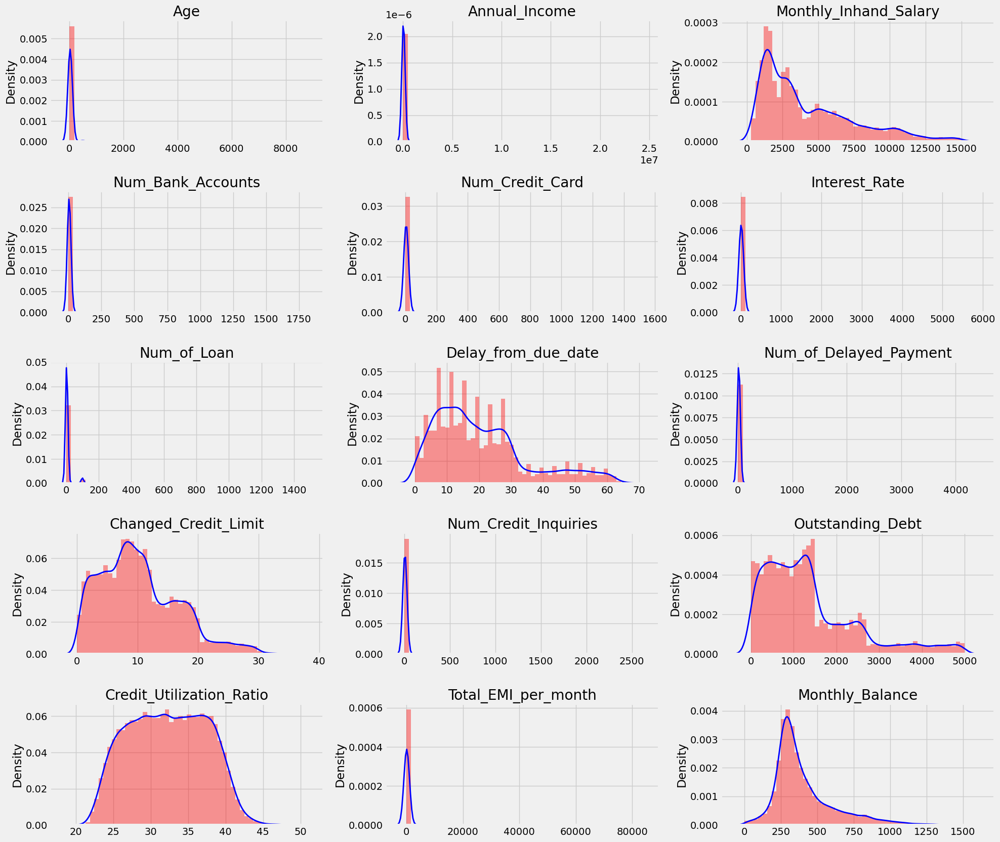

In [29]:
columns_to_plot = df_num.columns
plt.figure(figsize=(20,20))
for i,col_name in enumerate(columns_to_plot,1):
    plt.subplot(6,3,i)
    sns.distplot(x=df_num[col_name],color='red',kde_kws={'color': 'blue', 'lw': 2})
    plt.title(col_name)
plt.tight_layout()
plt.show()

In [30]:
df_num.skew()

Age                          9.132348
Annual_Income               12.770764
Monthly_Inhand_Salary        1.114599
Num_Bank_Accounts           11.375432
Num_Credit_Card              8.533370
Interest_Rate                8.680120
Num_of_Loan                 16.581872
Delay_from_due_date          1.026323
Num_of_Delayed_Payment      14.280068
Changed_Credit_Limit         0.717951
Num_Credit_Inquiries         9.871596
Outstanding_Debt             1.326057
Credit_Utilization_Ratio     0.026459
Total_EMI_per_month          7.214393
Monthly_Balance              1.514561
dtype: float64

### ↘️ Observation:

##### 👉 1. Age, Annual Income, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Num_of_Delayed_Payment, and Num_Credit_Inquiries exhibit highly skewed distributions, indicating a concentration of data points on one side of the mean.

##### 👉 2. Monthly Inhand Salary, Delay_from_due_date, Changed_Credit_Limit, Outstanding_Debt, Total_EMI_per_month, and Monthly_Balance display moderate skewness, suggesting a moderate degree of asymmetry in the distributions.

##### 👉 3. Credit_Utilization_Ratio demonstrates almost no skewness, indicating a nearly symmetrical distribution.

### categorical variable plots

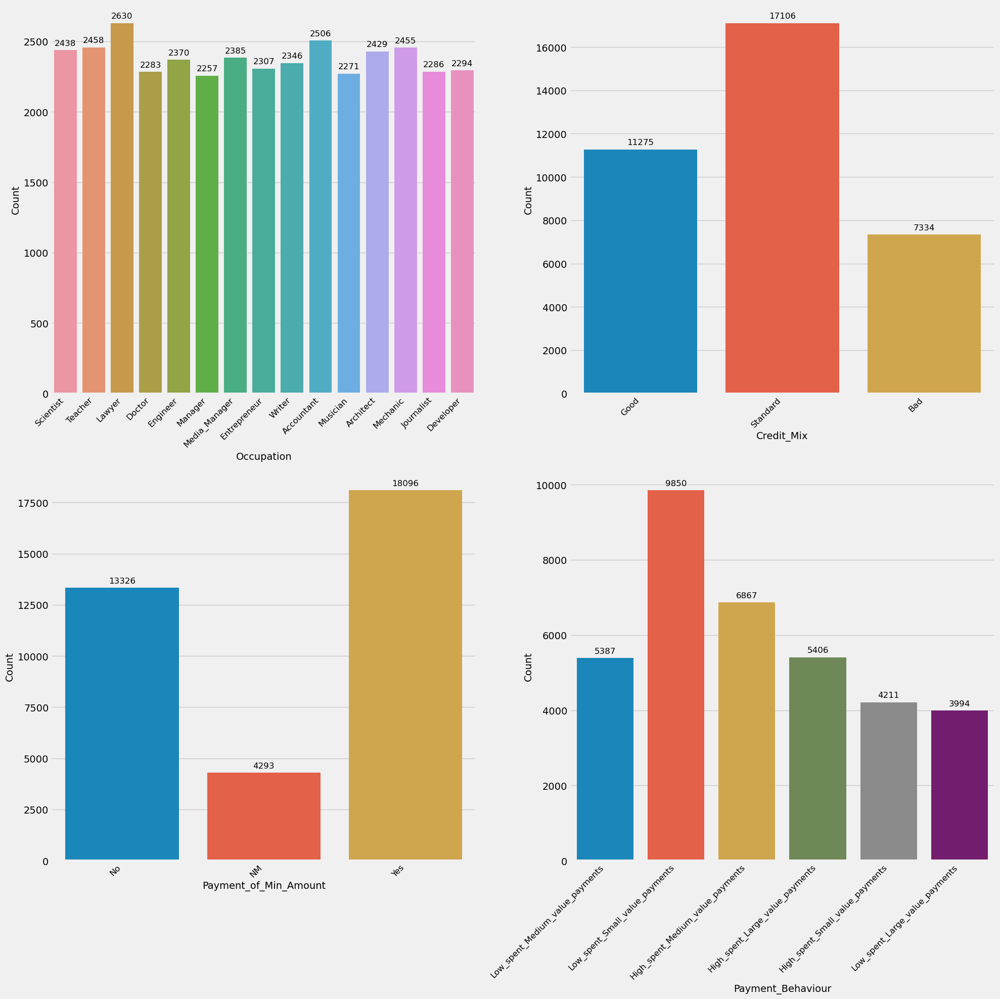

In [31]:
data_cat = ['Occupation','Credit_Mix',
       'Payment_of_Min_Amount', 'Payment_Behaviour']
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20)) 

for variable, subplot in zip(data_cat, ax.flatten()):
    z = sns.countplot(x=df_cat[variable], ax=subplot) 
    z.set_xlabel(variable, fontsize=14)
    z.set_ylabel('Count', fontsize=14)
    z.set_xticklabels(z.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=12)
    
    
    for p in subplot.patches:
        subplot.annotate(format(p.get_height(), '.0f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha = 'center', va = 'center', 
                         xytext = (0, 10), 
                         textcoords = 'offset points',
                         fontsize=12)
plt.tight_layout()
plt.show()

### ↘️ Observation:

##### 👉 1.Occupation 
            - Highest Occurrences: Lawyer,Accountant,Teacher
            - Lowest Occurrences:  Manager,Musician,Doctor
##### 👉 2.Credit_Mix 
            - This Standard category appears most frequently in the dataset, indicating a significant presence of a specific type of credit mix.
            - Good category, While occurring less frequently than Standard
            - Although the least represented is Bad category, this group still plays a significant role in the dataset.
##### 👉 3.Payment_of_Min_Amount 
            - Yes(18096) : This category has the highest frequency in the dataset, indicating that a significant number of  individuals have made payments at least equal to the minimum amount due.
            - No(13326) : While occurring less frequently than category 2.0, this category still represents a substantial         portion of the dataset
##### 👉 4.Payment_Behaviour 
            - Low_spent_Small_value_payments : This category has the highest frequency in the dataset, suggesting that a           significant number of individuals exhibit a specific type of payment behavior. 
            - High_spent_Medium_value_payments : While occurring less frequently than category Low_spent_Small_value,this         category still represents a substantial portion of the dataset.
            - High_spent_Large_value_payments : This category represents a significant proportion of the dataset, indicating the   presence of a distinct group with a specific payment behavior pattern.

# 4.4 Bivariate Analysis

## * Quantitative - Quantitative

### Heatmap

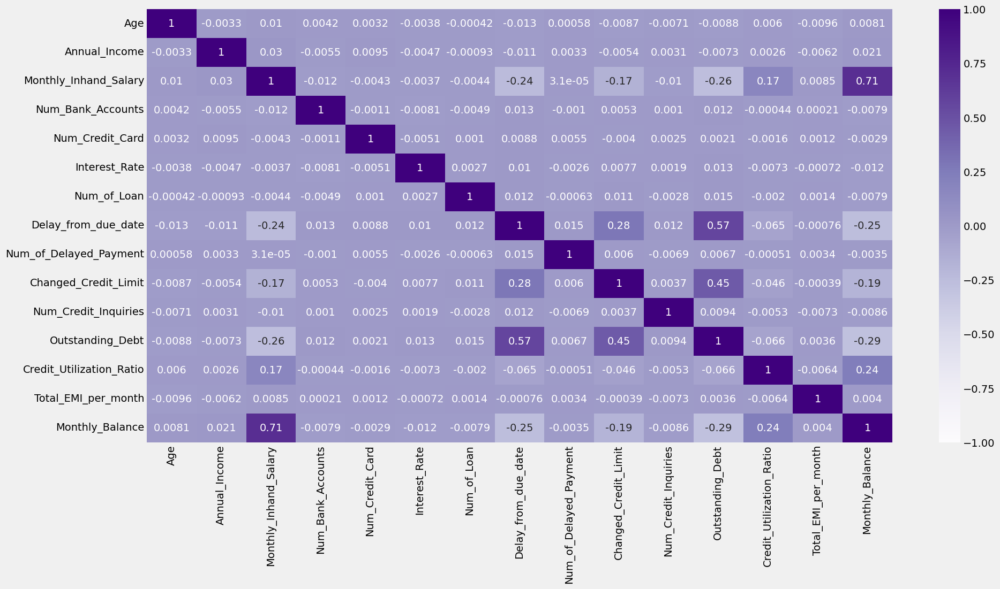

In [32]:
plt.figure(figsize=(20,10))
#cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df_num.corr(), vmax=1, vmin=-1,cmap="Purples", annot=True)
plt.show()

### ↘️ Observation:

##### 👉 1.Monthly_Inhand_Salary and Monthly_Balance : This strong positive correlation indicates that individuals with higher monthly salaries tend to maintain higher monthly balances.

##### 👉 2.Outstanding_Debt and Delay_from_due_date : This moderate positive correlation suggests that individuals with higher outstanding debts tend to experience longer delays in payment.

##### 👉 3.Changed_Credit_Limit and Delay_from_due_date : This moderate positive correlation implies that changes in the credit limit may influence the delay from the due date.

##### 👉 4.Delay_from_due_date and Credit_Utilization_Ratio : This moderate positive correlation suggests that individuals with higher credit utilization ratios might experience longer delays in payment.

##### 👉 5.Age and Monthly_Inhand_Salary : This weak positive correlation implies a slight tendency for individuals with higher salaries to be relatively older.

##### 👉 6.Interest_Rate and Outstanding_Debt : This weak positive correlation suggests a slight tendency for higher outstanding debts to be associated with higher interest rates.

## * Quantitative - categorical 

### Bar Plot

### Annual Income by Occupation

In [33]:
def add_value_labels(bar_plot):
    for p in bar_plot.patches:
        bar_plot.annotate(format(p.get_height(), '.2f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha = 'center', va = 'center', 
                         xytext = (0, 10), 
                         textcoords = 'offset points')

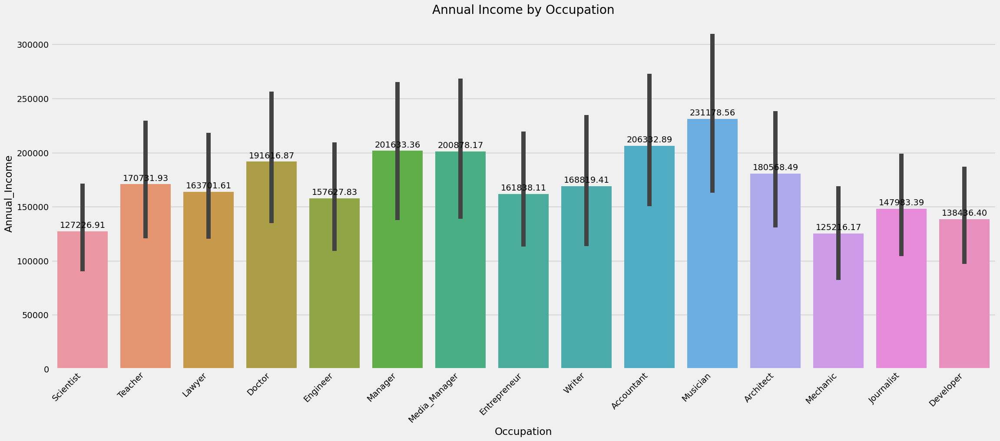

In [34]:
plt.figure(figsize=(25, 10))
bar_plot=sns.barplot(x='Occupation', y='Annual_Income', data=df)
plt.title('Annual Income by Occupation')
bar_plot.set_xticklabels(bar_plot.get_xticklabels(), rotation=45, horizontalalignment='right')
add_value_labels(bar_plot)
plt.show()

### ↘️ Observation:

##### 👉 1. Musician: Musician has the highest annual income of 231,178.
##### 👉 2. Occupations Falling Between 231,178 and 125,216: Teacher,Scientist,Architect,Media_Manager,Engineer, Writer,Entrepreneur,Developer,Journalist,Doctor,Manager,Accountant,Lawyer,
##### 👉 3. Mechanic: Mechanic has the lowest annual income of 125,216.    

### Delay from Due Date by Payment Behavior

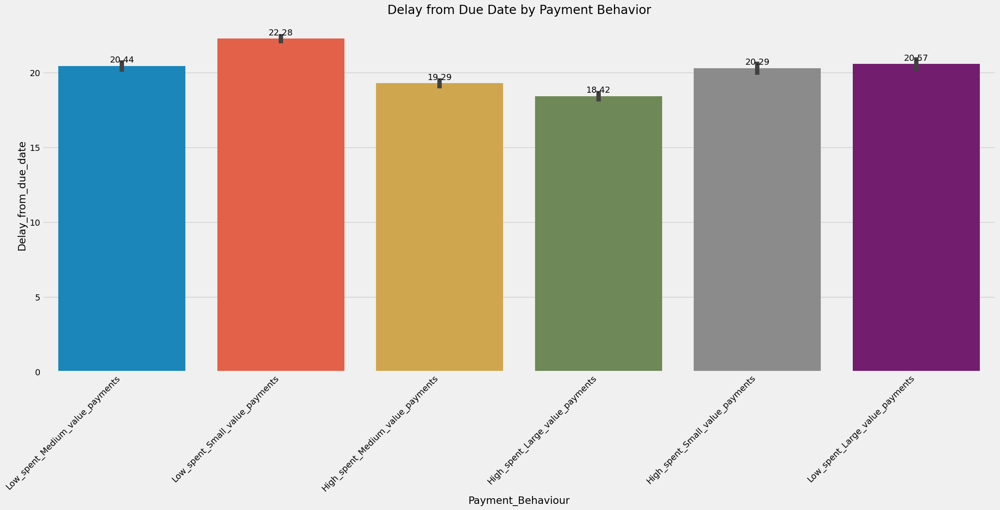

In [35]:
plt.figure(figsize=(25, 10))
bar_plot = sns.barplot(x='Payment_Behaviour', y='Delay_from_due_date', data=df)
bar_plot.set_xticks(range(len(df['Payment_Behaviour'].unique())))
bar_plot.set_xticklabels(df['Payment_Behaviour'].unique(), rotation=45, horizontalalignment='right')
plt.title('Delay from Due Date by Payment Behavior')
add_value_labels(bar_plot)
plt.show()

### ↘️ Observation:

##### 👉 1.Among the different payment behavior categories, "Low_spent_Small_value_payments" demonstrates the highest number of occurrences in the "Delay_from_due_date" variable.
##### 👉 2.Following "Low_spent_Small_value_payments," "Low_spent_Large_value_payments" exhibits the second-highest frequency in the "Delay_from_due_date" variable.
##### 👉 3.In contrast, "High_spent_Large_value_payments" shows a significantly lower number of occurrences in the "Delay_from_due_date" variable.

### Credit Utilization Ratio by Credit Score

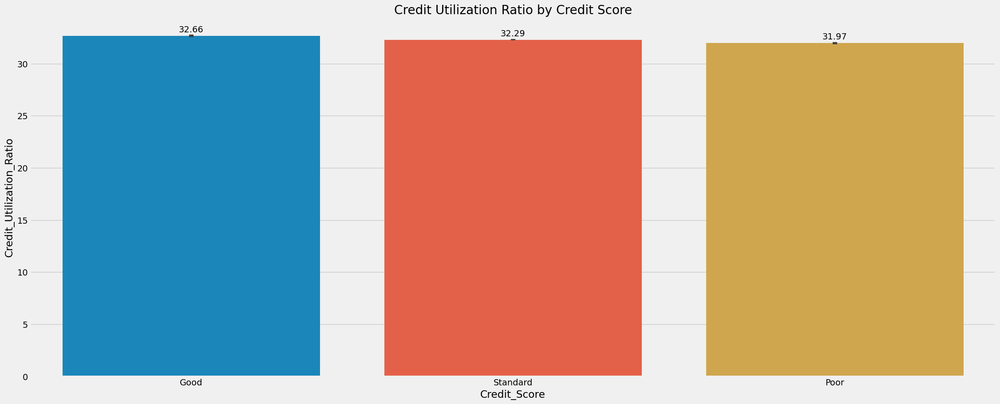

In [36]:
plt.figure(figsize=(25, 10))
bar_plot=sns.barplot(x='Credit_Score', y='Credit_Utilization_Ratio', data=df)
plt.title('Credit Utilization Ratio by Credit Score')
add_value_labels(bar_plot)
plt.show()

### ↘️ Observation:

##### 👉 1.Three of them fall within the same range with only a slight point difference.
##### 👉 2.The "Good" category exhibits a Credit_Utilization_Ratio of 32.66, while the "Standard" category has a value of 32.29, and the "Poor" category has a value of 31.97.

### Total EMI per Month by Credit Mix

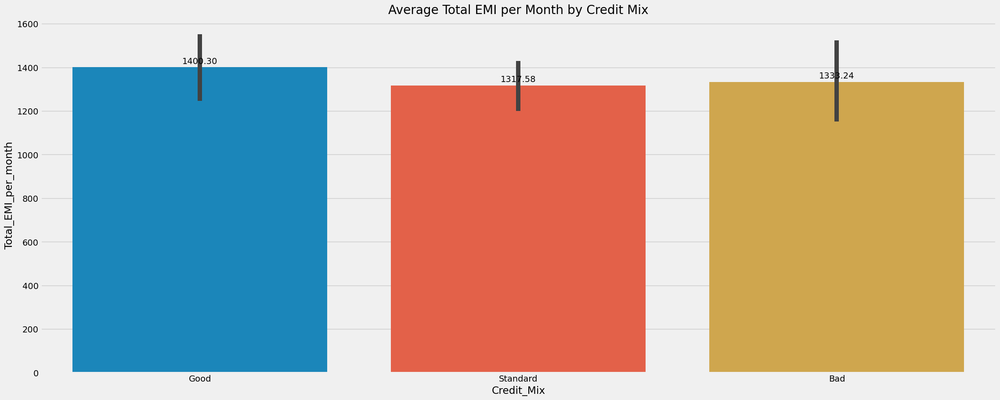

In [37]:
plt.figure(figsize=(25, 10))
bar_plot=sns.barplot(x='Credit_Mix', y='Total_EMI_per_month', data=df, estimator=np.mean)
plt.title('Average Total EMI per Month by Credit Mix')
add_value_labels(bar_plot)
plt.show()

### ↘️ Observation:

##### 👉 1.The slight point difference among the categories suggests a relatively similar level of credit utilization ratio across all three categories, indicating a balanced use of available credit among individuals categorized as "Good," "Standard," and "Poor."
##### 👉 2.Individuals classified under the "Good" credit mix category tend to have the highest Total_EMI_per_month (140.30), followed by the "Bad" category (133.24) and the "Standard" category (131.58). This could indicate that individuals in the "Good" category might be managing higher levels of monthly EMI payments compared to those in the "Standard" and "Bad" categories.

### Monthly Balance by Payment of Minimum Amount

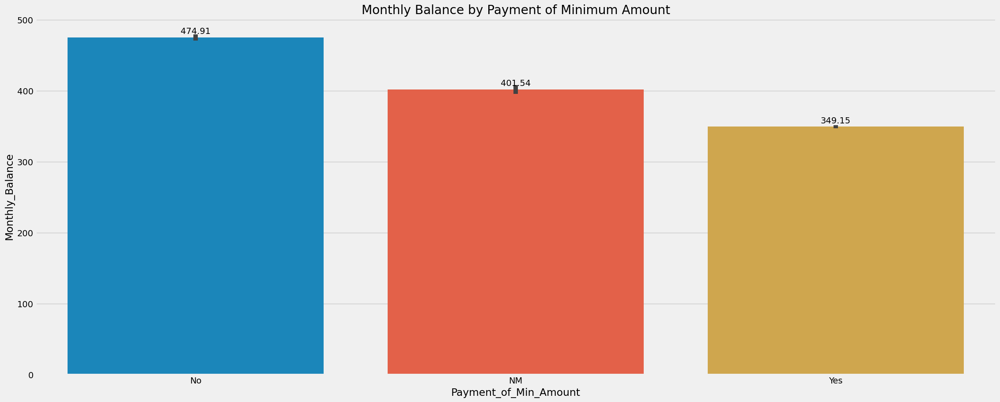

In [38]:
plt.figure(figsize=(25, 10))
bar_plot=sns.barplot(x='Payment_of_Min_Amount', y='Monthly_Balance', data=df)
plt.title('Monthly Balance by Payment of Minimum Amount')
add_value_labels(bar_plot)
plt.show()

### ↘️ Observation:

##### 👉 Individuals who do not make the minimum amount due payment ("No" category) have a higher average Monthly_Balance of 474.91 compared to those who do make the minimum payment ("Yes" category) with an average Monthly_Balance of 349.15.

### kernel density plot

### Monthly Balance Distribution by Credit Score

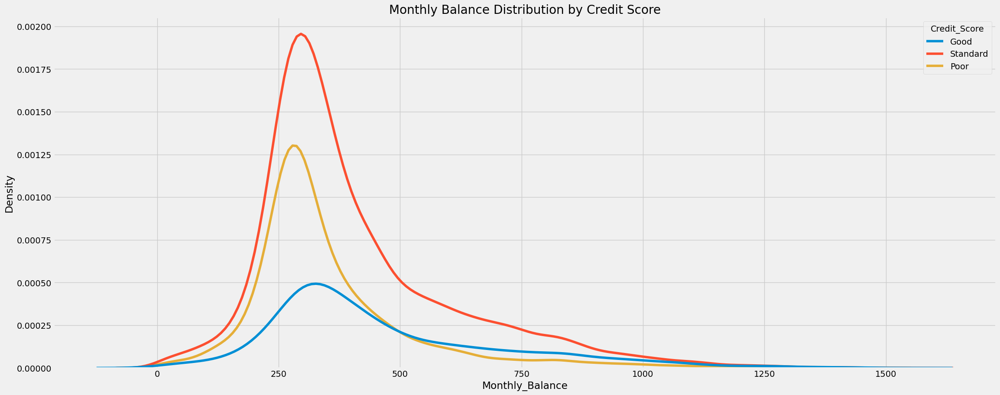

In [39]:
plt.figure(figsize=(25, 10))
sns.kdeplot(data=df, x="Monthly_Balance", hue="Credit_Score")
plt.title("Monthly Balance Distribution by Credit Score")
plt.show()

### ↘️ Observation:

##### 👉 The distribution of Monthly_Balance with respect to Credit_Score appears to have a shape that closely resembles a normal distribution. However, to perform a more in-depth analysis and draw more accurate conclusions, it is essential to calculate and compare the means within each Credit_Score category. This analysis will provide a clearer understanding of the specific differences in Monthly_Balance among the different credit score groups and whether they follow a normal distribution within each category.

### Distribution of Number of Delayed Payments by Payment of Minimum Amount

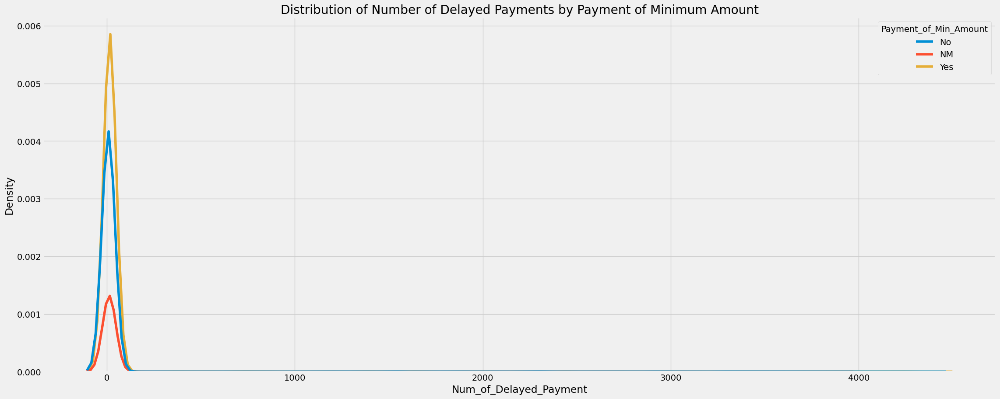

In [40]:
plt.figure(figsize=(25, 10))
sns.kdeplot(data=df, x="Num_of_Delayed_Payment", hue="Payment_of_Min_Amount")
plt.title("Distribution of Number of Delayed Payments by Payment of Minimum Amount")
plt.show()

### ↘️ Observation:

##### 👉 The distribution of the number of delayed payments based on the payment of the minimum amount shows a certain degree of skewness for all three payment minimum amount categories.

### Distribution of Monthly Inhand Salary by Payment Behaviour

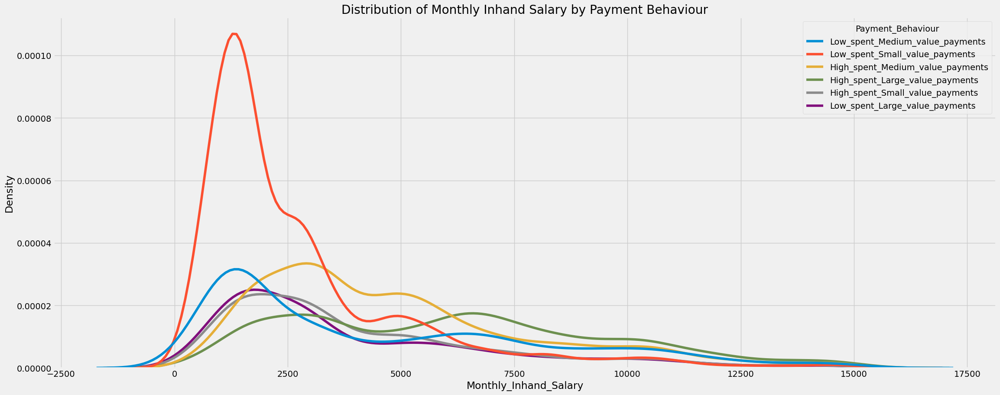

In [41]:
plt.figure(figsize=(25, 10))
sns.kdeplot(data=df, x="Monthly_Inhand_Salary", hue="Payment_Behaviour")
plt.title("Distribution of Monthly Inhand Salary by Payment Behaviour")
plt.show()

### ↘️ Observation:

##### 👉 The distribution of Monthly Inhand Salary by Payment Behaviour indicates that the category "low spend small value payment" is dominant and follows an almost normal distribution, while the other categories do not seem to exhibit this pattern. Further analysis can be conducted to gain a better understanding of the distribution and explore potential underlying factors contributing to these variations in the data.

### Distribution of Interest Rate by Credit Score

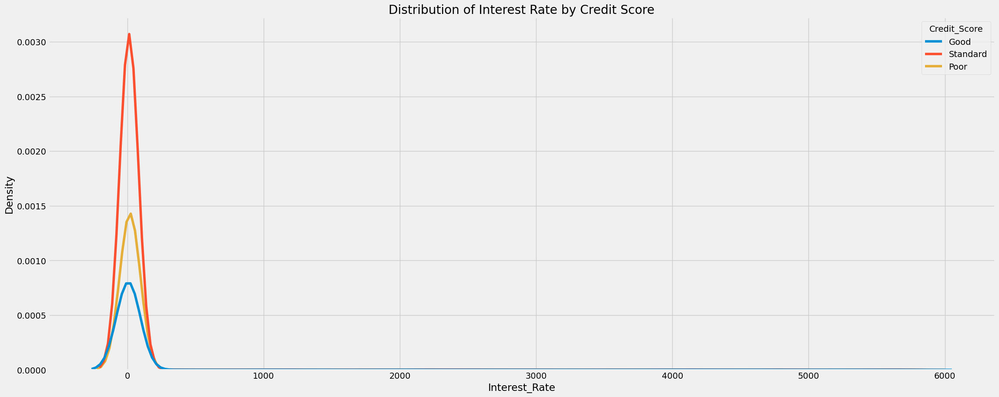

In [42]:
plt.figure(figsize=(25, 10))
sns.kdeplot(data=df, x="Interest_Rate", hue="Credit_Score")
plt.title("Distribution of Interest Rate by Credit Score")
plt.show()

### ↘️ Observation:

##### 👉The distribution of Interest Rate by Credit Score exhibits a noticeable skewness across all three Credit_Score categories, with the standard category having a higher number and the Good category showing a lower number. Further analysis may be required to better understand the specific implications of this skewness and its potential impact on the interpretation of the data.

### Boxplot 

### For Target vs numerical variable 

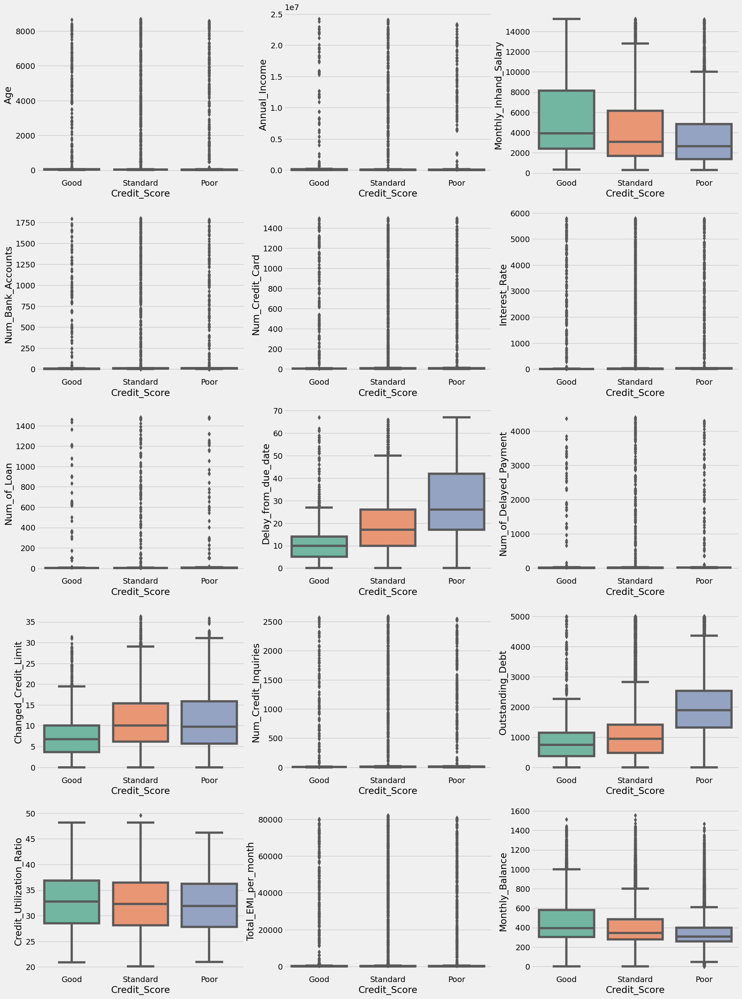

In [43]:
numeric_columns = df_num.columns
plt.figure(figsize=(20, 60))

sns.set_palette(sns.color_palette("Set2", 8))
for i, variable in enumerate(numeric_columns):
        plt.subplot(10,3,i+1)
        
        sns.boxplot(x='Credit_Score',y= df[variable], data=df)     
        sns.despine(top=True,right=True,left=True) 

### ↘️ Observation:

##### 👉 1.The absence of outliers between Credit_Score and Credit_Utilization_Ratio suggests a relatively consistent and stable relationship between these two variables. 
##### 👉 2.Credit Score and Other Variables Insights:The presence of a substantial number of outliers between Credit_Score and other variables indicates potential variations and inconsistencies in the relationship between Credit_Score and these specific attributes.

## * categorical - categorical

###  Credit_Score by Payment_Behaviour

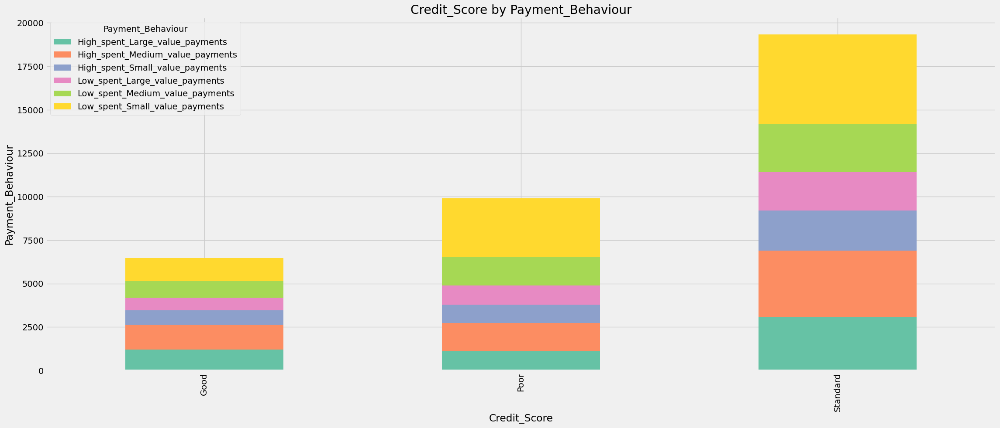

In [44]:
cross_tab = pd.crosstab(df['Credit_Score'], df['Payment_Behaviour'])
cross_tab.plot(kind='bar', stacked=True, figsize=(25, 10))
plt.title('Credit_Score by Payment_Behaviour')
plt.xlabel('Credit_Score')
plt.ylabel('Payment_Behaviour')
plt.show()

### ↘️ Observation:

##### 👉 1. For the "Good" credit card score category:
           - The "Low_spent_small_value_payment" type has the highest frequency among all the payment behavior types in the           dataset.
           - The "Low_spent_large_value_payment" type has the lowest frequency among all the payment behavior types in the             dataset for the "Good" credit card score category.
           
##### 👉 2.For the "Poor" credit card score category:
           - Similar to the "Good" category, the "Low_spent_small_value_payment" type has the highest frequency among all
      the  payment behavior types in the dataset for the "Poor" credit card score category.
           - The "High_spend_medium_value_payment" type has the second-highest frequency among all the payment behavior 
      types in the dataset for the "Poor" credit card score category.

##### 👉 3.For the "Standard" credit card score category:
           - Similar to the "Poor" category, the "Low_spent_small_value_payment" type has the highest frequency among all 
      the payment behavior types in the dataset for the "Standard" credit card score category.
           - The "High_spend_medium_value_payment" type has the second-highest frequency among all the payment behavior 
      types in the dataset for the "Standard" credit card score category.

### Credit Score by Credit Mix

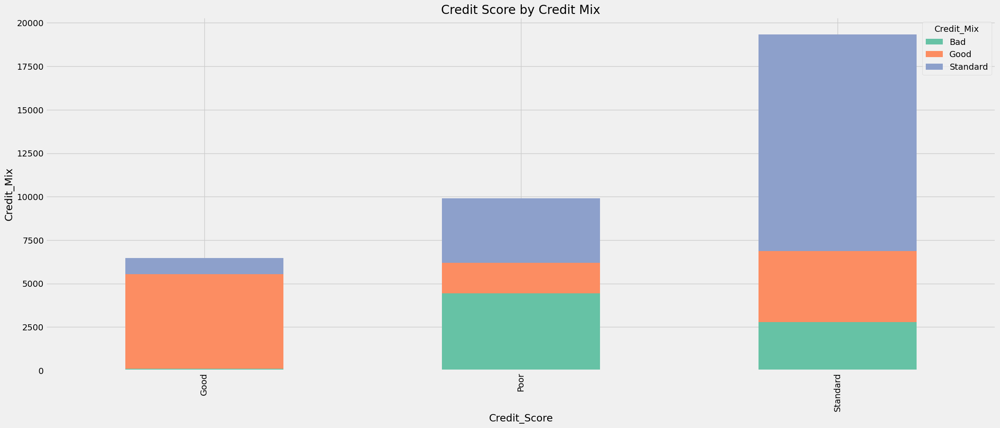

In [45]:
cross_tab = pd.crosstab(df['Credit_Score'], df['Credit_Mix'])
cross_tab.plot(kind='bar', stacked=True, figsize=(25, 10))
plt.title('Credit Score by Credit Mix')
plt.xlabel('Credit_Score')
plt.ylabel('Credit_Mix')
plt.show()

### ↘️ Observation:

##### 👉 1.For the "Good" credit score category:
           - There are only two credit card mix types present, namely "Good" and "Standard."

##### 👉 2.For the "Poor" credit score category:
           - There are three credit card mix types present, with "Bad" having the highest frequency, followed by "Standard."

##### 👉 3.For the "Standard" credit score category:
           - Similar to the "Poor" category, there are three credit card mix types present, with "Standard" being the most            frequent, followed by "Good" and "Bad."

### Payment Behaviour by Occupation

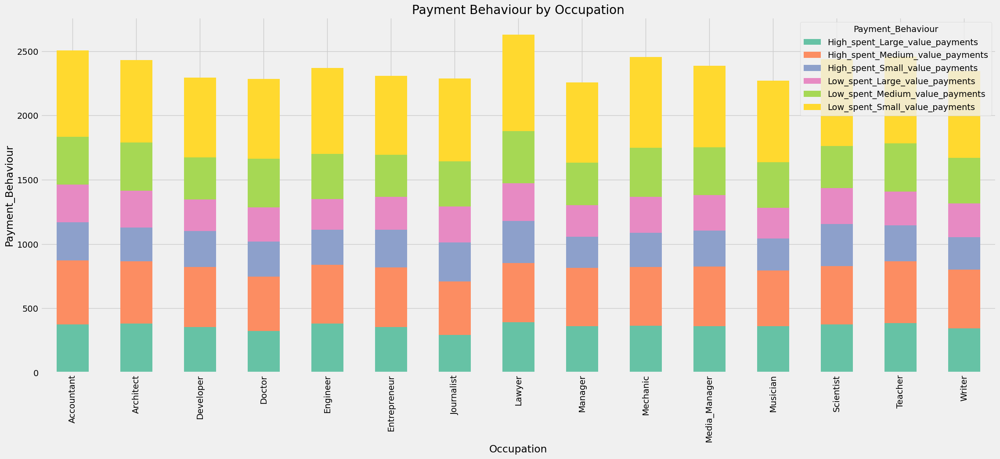

In [46]:
cross_tab = pd.crosstab(df['Occupation'], df['Payment_Behaviour'])
cross_tab.plot(kind='bar', stacked=True, figsize=(25, 10))
plt.title('Payment Behaviour by Occupation')
plt.xlabel('Occupation')
plt.ylabel('Payment_Behaviour')
plt.show()

### Credit Score by Payment of Minimum Amount

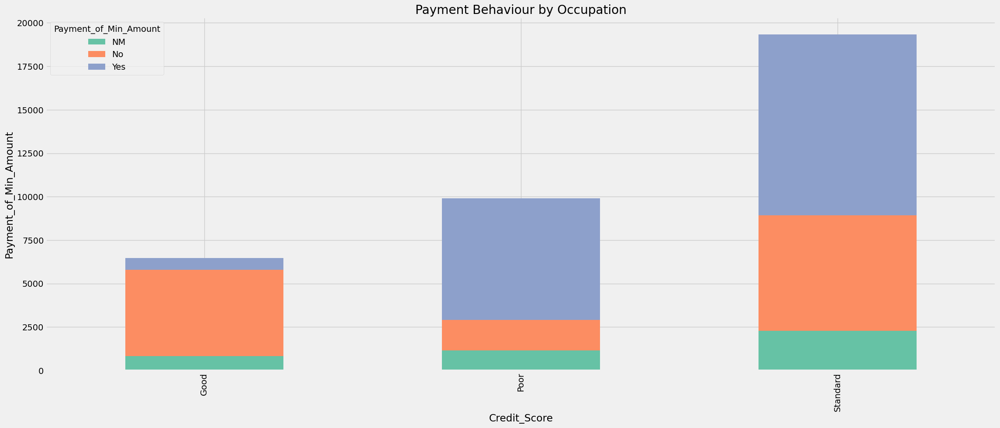

In [47]:
cross_tab = pd.crosstab(df['Credit_Score'], df['Payment_of_Min_Amount'])
cross_tab.plot(kind='bar', stacked=True, figsize=(25, 10))
plt.title('Payment Behaviour by Occupation')
plt.xlabel('Credit_Score')
plt.ylabel('Payment_of_Min_Amount')
plt.show()

### ↘️ Observation:

##### 👉 1.For the "Good" credit score category:
              - The category has a high number of instances with no Payment_of_Min_Amount.

##### 👉 2.For the "Poor" credit score category:
              - The category has a high number of instances with yes Payment_of_Min_Amount.

##### 👉 3.For the "Standard" credit score category:
              - The category has a high number of instances with yes Payment_of_Min_Amount, followed by instances with no 
    values in Payment_of_Min_Amount.

# 4.5 Multivariate Analysis

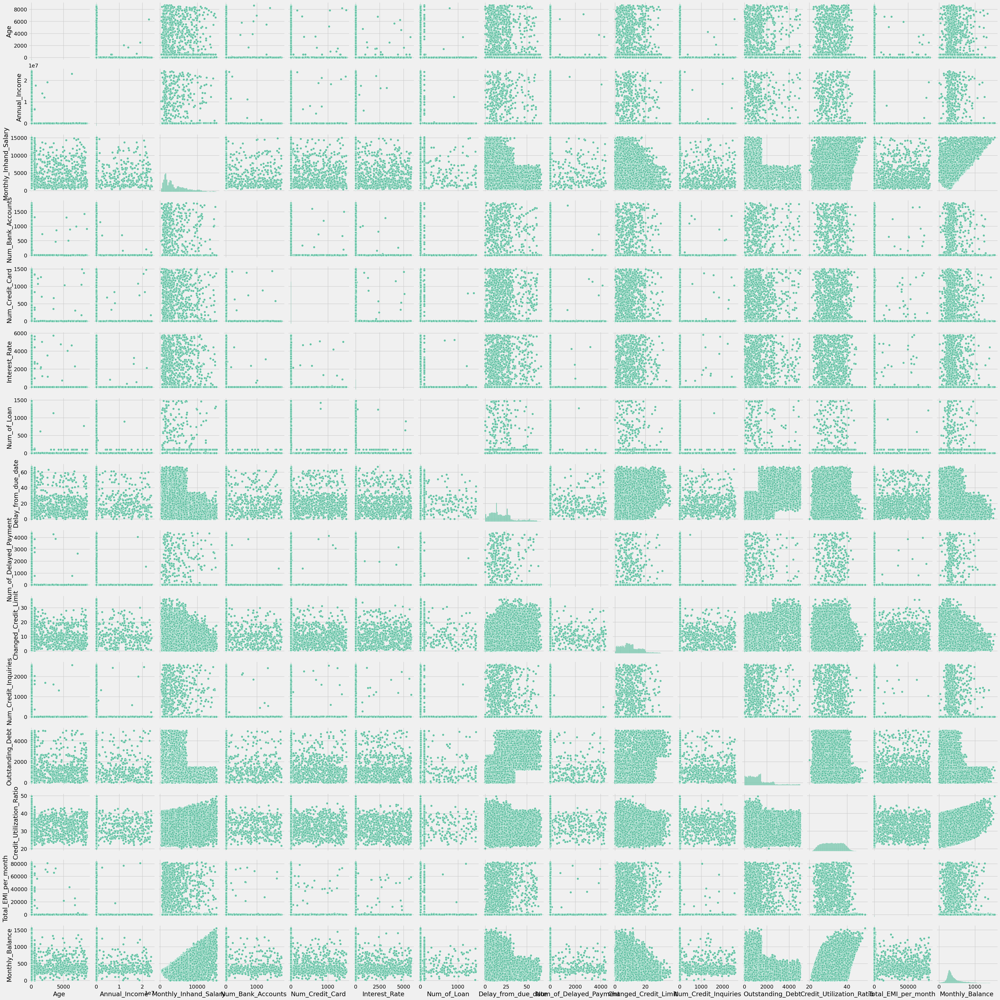

In [48]:
sns.pairplot(df)
plt.show()

### ↘️ Observation:
##### Multivariate statistics compare more than two variables.
##### we can see the all the plots from the above plots.

# 5.Missing value treatment

In [49]:
import missingno as ms

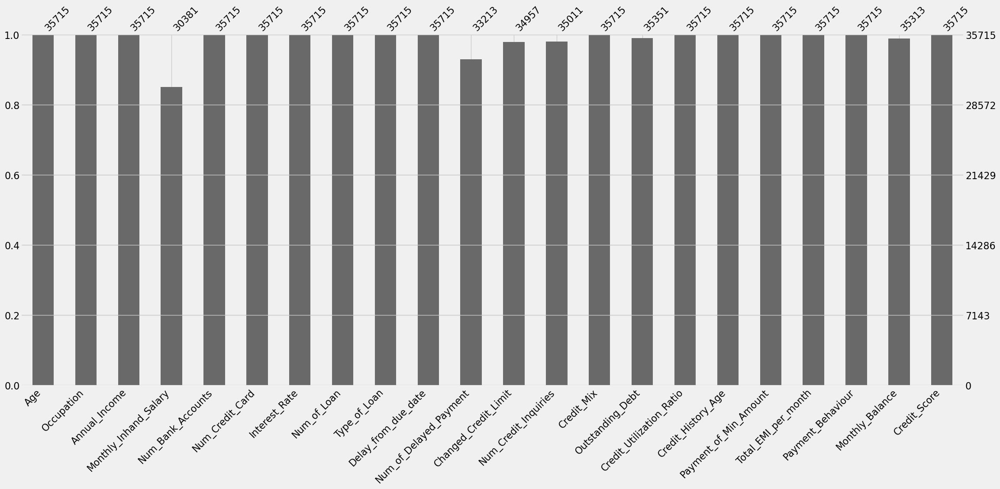

In [50]:
ms.bar(df)
plt.show()

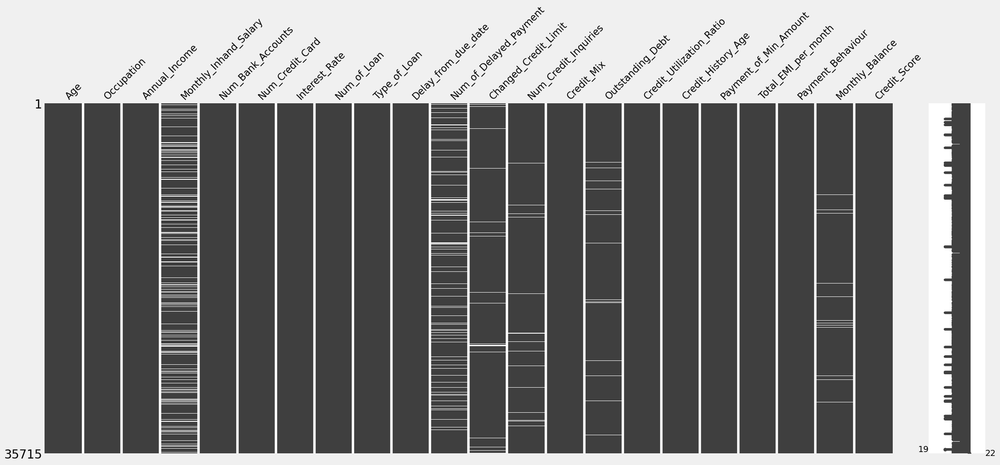

In [51]:
ms.matrix(df)
plt.show()

In [52]:
def missing_value_percentage(df):
    missvalcount = df.isnull().sum()
    missvalpercent = round(df.isnull().sum() / df.shape[0] * 100)
    dtypes = df.dtypes
    newdf = pd.concat([missvalcount, missvalpercent, dtypes], axis=1)
    newdf.columns = ['missvalcount', 'missval%', 'dtype']
    newdf = newdf[newdf['missvalcount'] != 0].sort_values(by='missvalcount', ascending=False)
    return newdf

In [53]:
missing_value_percentage(df)

,missvalcount,missval%,dtype
Monthly_Inhand_Salary,5334,15.0,float64
Num_of_Delayed_Payment,2502,7.0,float64
Changed_Credit_Limit,758,2.0,float64
Num_Credit_Inquiries,704,2.0,float64
Monthly_Balance,402,1.0,float64
Outstanding_Debt,364,1.0,float64


### ↘️ Observation:

##### 👉 Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Monthly_Balance, and Outstanding_Debt have missing value percentages ranging from 1 to 7, while Monthly_Inhand_Salary has the highest missing value percentage of 15%.

### Missing values treatment for numerical variable

In [54]:
num_names =['Monthly_Inhand_Salary','Num_of_Delayed_Payment','Changed_Credit_Limit','Num_Credit_Inquiries','Monthly_Balance','Outstanding_Debt']

In [55]:
for col in num_names:
    df[col] = df[col].fillna(df[col].median())

In [56]:
missing_value_percentage(df)

,missvalcount,missval%,dtype


##### For imputing missing values for numerical featurers we have used median value

In [57]:
df_cat2 = df.select_dtypes(include='object')
df_num2 = df.select_dtypes(exclude='object')

# 6.Outlier detection

## 6.1 Discovery of Outliers

In [58]:
Q1 = df_num2.quantile(0.25) 
Q3 = df_num2.quantile(0.75) 
IQR = Q3 - Q1 

outlier = ((df_num2 < (Q1 - 1.5 * IQR)) | (df_num2 > (Q3 + 1.5 * IQR)))
for i in outlier.columns:
    num_outliers = len(outlier[outlier[i] == True][i])
    if num_outliers > 0:
        print(f'Total number of outliers in column {i} are {num_outliers}')

Total number of outliers in column Age are 960
Total number of outliers in column Annual_Income are 1052
Total number of outliers in column Monthly_Inhand_Salary are 1446
Total number of outliers in column Num_Bank_Accounts are 440
Total number of outliers in column Num_Credit_Card are 803
Total number of outliers in column Interest_Rate are 776
Total number of outliers in column Num_of_Loan are 1581
Total number of outliers in column Delay_from_due_date are 1400
Total number of outliers in column Num_of_Delayed_Payment are 264
Total number of outliers in column Changed_Credit_Limit are 557
Total number of outliers in column Num_Credit_Inquiries are 798
Total number of outliers in column Outstanding_Debt are 2326
Total number of outliers in column Credit_Utilization_Ratio are 1
Total number of outliers in column Total_EMI_per_month are 2466
Total number of outliers in column Monthly_Balance are 2692


## 6.2 Visualizing outliers using Boxplots & distplot

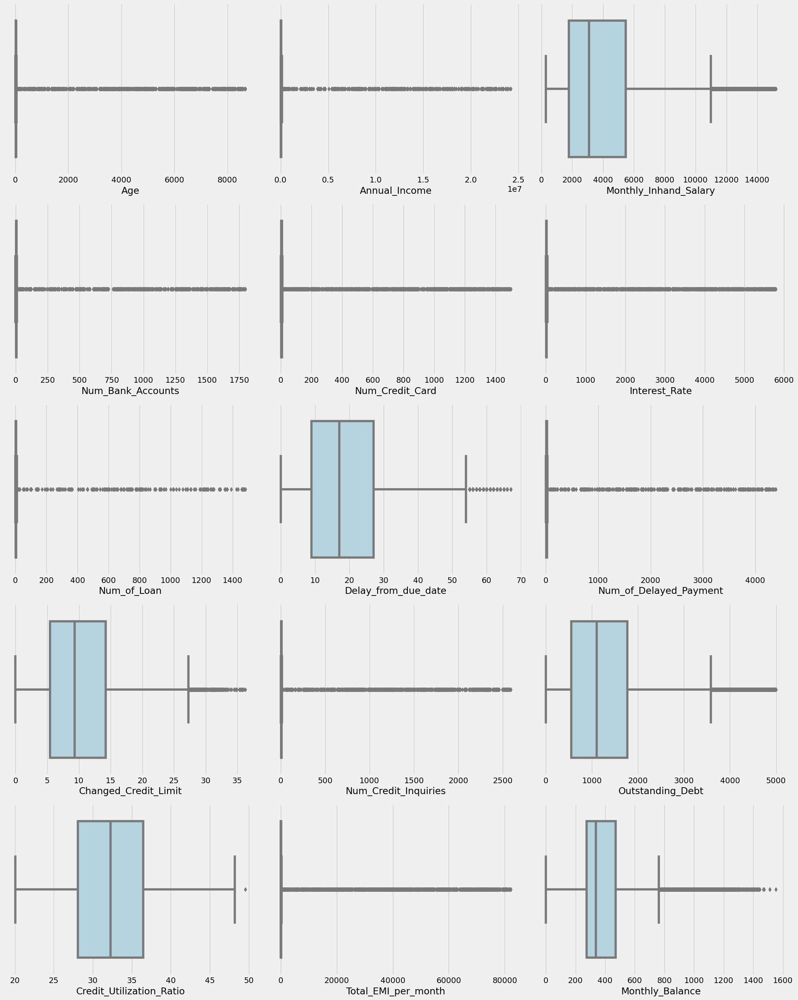

In [59]:
columns_to_plot = df_num2.columns
plt.figure(figsize=(20, 25))
for i,col_name in enumerate(columns_to_plot,1):
    plt.subplot(5,3,i)
    sns.boxplot(x=df[col_name],color='lightblue')
    plt.tight_layout()
plt.show()

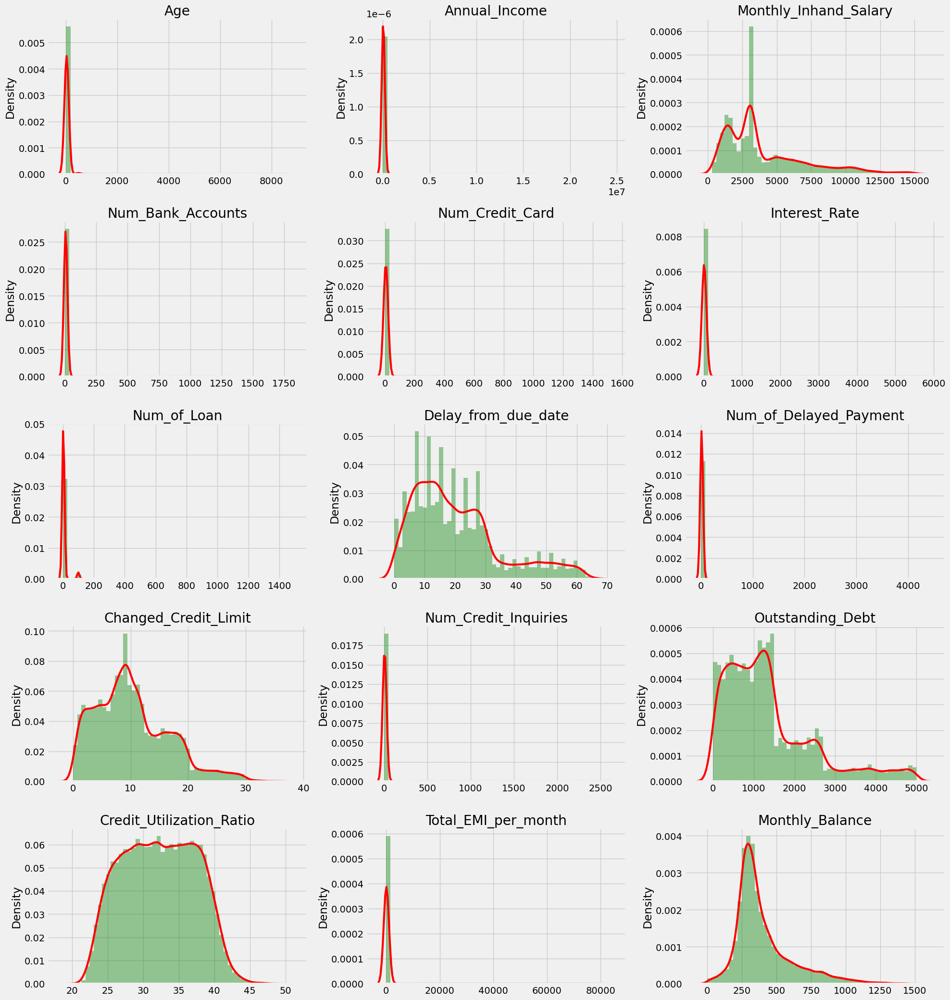

In [60]:
plt.figure(figsize=(20,25))
for i,col_name in enumerate(columns_to_plot,1):
    plt.subplot(6,3,i)
    sns.distplot(x=df[col_name],color='green',kde_kws={'color': 'red', 'lw': 3})
    plt.title(col_name)
plt.tight_layout()
plt.show()

In [61]:
df_num2.skew()

Age                          9.132348
Annual_Income               12.770764
Monthly_Inhand_Salary        1.337347
Num_Bank_Accounts           11.375432
Num_Credit_Card              8.533370
Interest_Rate                8.680120
Num_of_Loan                 16.581872
Delay_from_due_date          1.026323
Num_of_Delayed_Payment      14.815609
Changed_Credit_Limit         0.734499
Num_Credit_Inquiries         9.973268
Outstanding_Debt             1.338555
Credit_Utilization_Ratio     0.026459
Total_EMI_per_month          7.214393
Monthly_Balance              1.530843
dtype: float64

## 6.3 Removal of Outliers

#### Percentile method

In [62]:
def outlier(x, column_name):
    max_value = df[column_name].quantile(0.95)
    min_value = df[column_name].quantile(0.05)
    df[column_name] = np.clip(df[column_name], min_value, max_value)
    return df

In [63]:
df2 = outlier(df, "Age")  
df3 = outlier(df2, "Annual_Income")  
df4 = outlier(df3, "Num_Bank_Accounts")  
df5 = outlier(df4, "Num_Credit_Card")  
df6 = outlier(df5, "Interest_Rate")  
df7 = outlier(df6, "Num_of_Loan")
df8 = outlier(df7, "Num_of_Delayed_Payment")
df9 = outlier(df8, "Num_Credit_Inquiries")
df10 = outlier(df9, "Total_EMI_per_month")

#### Z-score method for (appr normal distribution)

In [64]:
def outlier_zscore(df, column_name, threshold=3):
    z_scores = np.abs((df[column_name] - df[column_name].mean()) / df[column_name].std())
    filtered_value = df[z_scores < threshold]
    return filtered_value

In [65]:
df11 = outlier_zscore(df10, "Monthly_Inhand_Salary")
df12 = outlier_zscore(df11,"Delay_from_due_date")
df13 = outlier_zscore(df12, "Changed_Credit_Limit")
df14 = outlier_zscore(df13, "Outstanding_Debt")
df15 = outlier_zscore(df14, "Credit_Utilization_Ratio")
df16 = outlier_zscore(df15, "Monthly_Balance")

In [66]:
df = df16.copy()

## 6.4 After removing outlier ,Visualizing using Boxplots & distplot

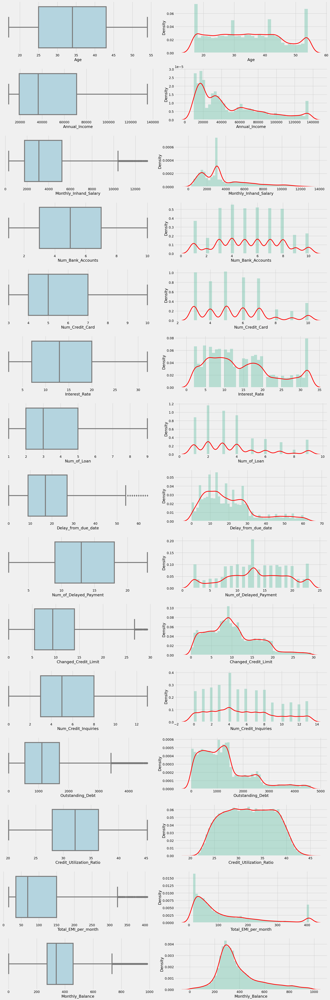

In [67]:
columns_to_plot = df_num2.columns
fig, axes = plt.subplots(15, 2, figsize=(20, 60))
for i, column in enumerate(columns_to_plot):
    sns.boxplot(x=df[column], color='lightblue', ax=axes[i, 0])
    sns.distplot(df[column], kde_kws={'color': 'red', 'lw': 3}, ax=axes[i, 1])
plt.tight_layout()
plt.show()

# 7. Data Transformation

## 7.1 Lable Encoding

In [68]:
categorical_columns = ["Occupation","Type_of_Loan","Credit_History_Age"]
for column in categorical_columns:
    df[column] = LabelEncoder.fit_transform(df[column])

In [69]:
categorical_columns = ["Credit_Mix","Payment_of_Min_Amount","Credit_Score","Payment_Behaviour"]
for column in categorical_columns:
    df[column] = OrdinalEncoder.fit_transform(df[[column]])

## 7.2 Scaling

In [70]:
columns_to_scale = ['Annual_Income','Monthly_Inhand_Salary','Type_of_Loan','Outstanding_Debt','Credit_Utilization_Ratio','Credit_History_Age','Total_EMI_per_month','Monthly_Balance']

In [71]:
for column in columns_to_scale:
    df[column] = standard_scale.fit_transform(df[[column]])

In [72]:
df

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Payment_Behaviour,Monthly_Balance,Credit_Score
2,54,12,-0.844555,-0.283352,3,4,3,4,-1.661608,3,...,4.0,1.0,-0.479305,-0.707058,-0.099858,1.0,-0.572280,4.0,-0.315086,0.0
3,23,12,-0.844555,-0.283352,3,4,3,4,-1.661608,5,...,4.0,1.0,-0.479305,-0.156396,-0.090569,1.0,-0.572280,5.0,-0.925129,0.0
4,23,12,-0.844555,-0.755404,3,4,3,4,-1.661608,6,...,4.0,1.0,-0.479305,-1.465273,-0.081280,1.0,-0.572280,1.0,-0.256893,0.0
6,23,12,-0.844555,-0.755404,3,4,3,4,-1.661608,3,...,4.0,1.0,-0.479305,-1.914742,-0.062702,1.0,-0.572280,5.0,-0.805599,0.0
9,28,13,-0.399331,-0.305258,2,4,6,1,-1.309928,7,...,2.0,1.0,-0.685613,1.270323,0.392468,1.0,-0.869070,0.0,0.553237,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99986,28,1,-0.819405,-0.716420,10,8,29,5,0.872621,33,...,9.0,0.0,2.300716,-1.481878,1.404988,2.0,-0.462381,5.0,-0.232811,1.0
99991,29,1,-0.819405,-0.716420,10,8,29,5,0.872621,33,...,9.0,0.0,2.300716,0.989859,1.544326,2.0,-0.462381,0.0,-0.280252,2.0
99993,25,9,-0.264036,-0.185989,4,6,7,2,-1.310993,23,...,3.0,1.0,-0.788943,-0.602417,1.024132,1.0,2.874234,4.0,0.074940,2.0
99997,25,9,-0.264036,-0.185989,4,6,32,2,-1.310993,27,...,3.0,1.0,-0.788943,1.808288,1.061288,1.0,-0.711910,0.0,0.735629,1.0
